In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from skopt.callbacks import DeltaYStopper

from sklearn.model_selection import KFold, cross_val_score, train_test_split, cross_validate
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import shapiro
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer, StandardScaler
from sklearn.impute import SimpleImputer
from category_encoders.target_encoder import TargetEncoder
from sklearn.model_selection import train_test_split
from scipy.stats import f_oneway

import mlflow
from mlflow.models.signature import infer_signature
from sklearn.model_selection import KFold, cross_val_score

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 0)

In [8]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [9]:
SEED = 42
KF_SPLITS = 5

In [10]:
df_train.columns

Index(['Order', 'PID', 'MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area',
       'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities',
       'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Overall Qual',
       'Overall Cond', 'Year Built', 'Year Remod/Add', 'Roof Style',
       'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type',
       'Mas Vnr Area', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual',
       'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       'Heating', 'Heating QC', 'Central Air', 'Electrical', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional',
       'Fireplaces', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt',
      

In [11]:
print(df_train.shape)
df_train.head()

(2344, 82)


,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,382,527359050,20,RL,80.0,10400,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,7,5,1976,1976,Gable,CompShg,HdBoard,HdBoard,BrkFace,189.0,TA,TA,CBlock,Gd,TA,No,Unf,0.0,Unf,0.0,1090.0,1090.0,GasA,TA,Y,SBrkr,1370,0,0,1370,0.0,0.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,479.0,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,6,2009,WD,Family,152000
1,835,906475070,60,RL,NaN,28698,Pave,NaN,IR2,Low,AllPub,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,2Story,5,5,1967,1967,Flat,Tar&Grv,Plywood,Plywood,NaN,0.0,TA,TA,PConc,TA,Gd,Gd,LwQ,249.0,ALQ,764.0,0.0,1013.0,GasA,TA,Y,SBrkr,1160,966,0,2126,0.0,1.0,2,1,3,1,TA,7,Min2,0,NaN,Attchd,1967.0,Fin,2.0,538.0,TA,TA,Y,486,0,0,0,225,0,NaN,NaN,NaN,0,6,2009,WD,Abnorml,185000
2,1899,534429030,90,RL,70.0,9842,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NAmes,Norm,Norm,Duplex,1Story,4,5,1962,1962,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,GasA,TA,Y,SBrkr,1224,0,0,1224,0.0,0.0,2,0,2,2,TA,6,Typ,0,NaN,CarPort,1962.0,Unf,2.0,462.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Normal,101800
3,679,535451170,90,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,1Story,4,5,1949,1950,Gable,CompShg,BrkFace,Stone,NaN,0.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,Wall,Fa,N,FuseF,1040,0,0,1040,0.0,0.0,2,0,2,2,TA,6,Typ,0,NaN,Detchd,1956.0,Unf,2.0,420.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,90000
4,701,902109130,190,RM,63.0,7627,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Artery,Norm,2fmCon,2Story,4,6,1920,1950,Gable,CompShg,AsbShng,AsbShng,NaN,0.0,Fa,TA,BrkTil,Fa,Po,No,Unf,0.0,Unf,0.0,600.0,600.0,GasA,Gd,N,SBrkr,1101,600,0,1701,0.0,0.0,2,0,4,2,Fa,8,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,N,0,0,148,0,0,0,NaN,NaN,NaN,0,10,2009,WD,Normal,94550


In [12]:
df_train.dtypes

Order                int64
PID                  int64
MS SubClass          int64
MS Zoning           object
Lot Frontage       float64
Lot Area             int64
Street              object
Alley               object
Lot Shape           object
Land Contour        object
Utilities           object
Lot Config          object
Land Slope          object
Neighborhood        object
Condition 1         object
Condition 2         object
Bldg Type           object
House Style         object
Overall Qual         int64
Overall Cond         int64
Year Built           int64
Year Remod/Add       int64
Roof Style          object
Roof Matl           object
Exterior 1st        object
Exterior 2nd        object
Mas Vnr Type        object
Mas Vnr Area       float64
Exter Qual          object
Exter Cond          object
Foundation          object
Bsmt Qual           object
Bsmt Cond           object
Bsmt Exposure       object
BsmtFin Type 1      object
BsmtFin SF 1       float64
BsmtFin Type 2      object
B

In [13]:
missing = (df_train.isnull().sum()/df_train.shape[0] * 100).round(2)
missing = missing[missing > 0]
print(missing.to_string())

Lot Frontage      16.77
Alley             93.09
Mas Vnr Type      60.84
Mas Vnr Area       0.81
Bsmt Qual          2.60
Bsmt Cond          2.60
Bsmt Exposure      2.69
BsmtFin Type 1     2.60
BsmtFin SF 1       0.04
BsmtFin Type 2     2.65
BsmtFin SF 2       0.04
Bsmt Unf SF        0.04
Total Bsmt SF      0.04
Bsmt Full Bath     0.04
Bsmt Half Bath     0.04
Fireplace Qu      48.81
Garage Type        5.12
Garage Yr Blt      5.20
Garage Finish      5.20
Garage Cars        0.04
Garage Area        0.04
Garage Qual        5.20
Garage Cond        5.20
Pool QC           99.49
Fence             79.95
Misc Feature      95.99


In [14]:
numeric_cols = df_train.select_dtypes(include=[np.number]).columns

results = []

for col in numeric_cols:
    data = df_train[col].dropna()
    if len(data) > 3:
        stat, p = shapiro(data)
        results.append({
            "Column": col,
            "W-Statistic": stat,
            "p-value": p,
            "Normal?": "Yes" if p > 0.05 else "No"
        })

df_normality = pd.DataFrame(results).sort_values(by="Normal?", ascending=False)

print(df_normality.to_string(index=False))

         Column  W-Statistic      p-value Normal?
          Order     0.956158 5.472553e-26      No
   Wood Deck SF     0.768477 1.921019e-49      No
  Bedroom AbvGr     0.853256 3.082878e-42      No
  Kitchen AbvGr     0.212569 1.071051e-71      No
  TotRms AbvGrd     0.934848 7.315099e-31      No
     Fireplaces     0.751218 1.240872e-50      No
  Garage Yr Blt     0.916097 1.979153e-33      No
    Garage Cars     0.841673 2.169926e-43      No
    Garage Area     0.973678 2.337867e-20      No
  Open Porch SF     0.714602 6.037013e-53      No
      Full Bath     0.715027 6.400799e-53      No
 Enclosed Porch     0.425197 1.436096e-65      No
     3Ssn Porch     0.074272 5.896603e-75      No
   Screen Porch     0.319587 8.099128e-69      No
      Pool Area     0.040425 1.089502e-75      No
       Misc Val     0.064783 3.653519e-75      No
        Mo Sold     0.970266 1.221029e-21      No
        Yr Sold     0.898330 7.253165e-37      No
      Half Bath     0.632418 2.389548e-57      No


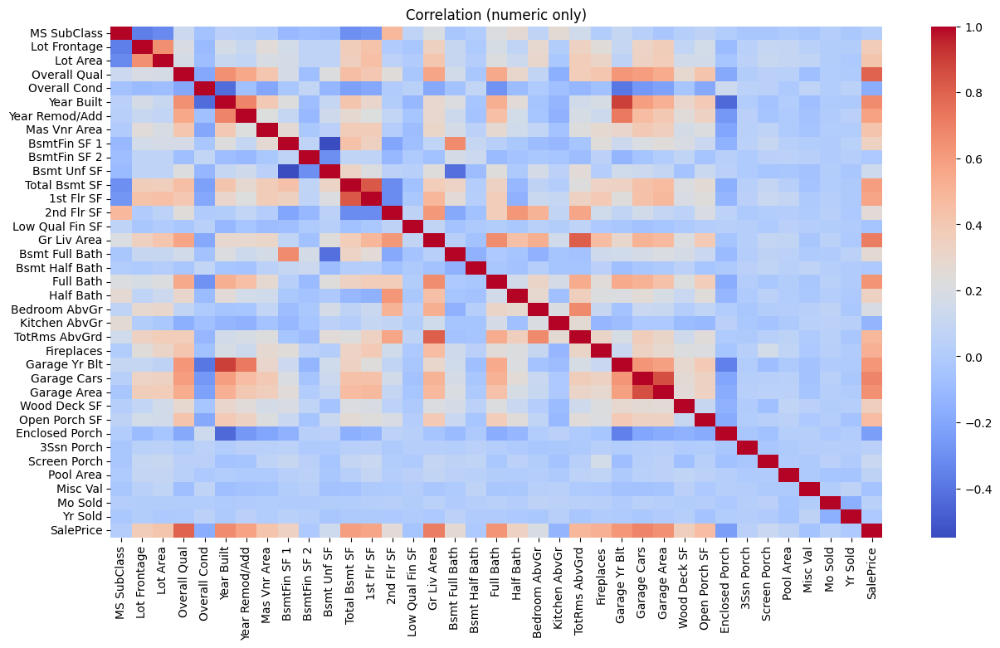

In [15]:
df2 = df_train.drop(columns=['Order','PID'], errors='ignore')

num = df2.select_dtypes(include=[np.number])

corr = num.corr(method='spearman')
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=False, cmap="coolwarm", fmt=".2f")
plt.title("Correlation (numeric only)")
plt.show()

In [16]:
sns.pairplot(df2, corner=True, height=3.5)
plt.suptitle("Features Pairplot")
plt.show()

🔹 Interpreting Results

p < 0.05 → reject null hypothesis → at least one category mean differs.

F-statistic → higher means more separation between groups.

In [17]:
cat_cols = df_train.select_dtypes(include=['object']).columns.tolist()

results = []

for col in cat_cols:
    try:
        groups = [df_train.loc[df_train[col] == cat, 'SalePrice'].dropna()
                  for cat in df_train[col].dropna().unique()]

        groups = [g for g in groups if len(g) > 1]
        if len(groups) > 1:
            f_stat, p_val = f_oneway(*groups)
            results.append({"Feature": col,
                            "F-statistic": f_stat,
                            "p-value": p_val})
    except Exception as e:
        print(f"Skipped {col} due to error: {e}")

anova_results = pd.DataFrame(results).sort_values(by="p-value")
print(anova_results)

significant = anova_results[anova_results["p-value"] < 0.05]
print("\nSignificant categorical features associated with SalePrice:")
print(significant)

           Feature  F-statistic        p-value
8     Neighborhood   113.249247   0.000000e+00
18      Exter Qual   736.365436   0.000000e+00
21       Bsmt Qual   529.955507  1.976263e-323
30    Kitchen Qual   672.454143  3.239848e-315
20      Foundation   174.396667  5.114029e-158
34   Garage Finish   385.436771  2.112142e-144
27      Heating QC   151.375728  2.845975e-115
24  BsmtFin Type 1   118.169800  2.315498e-111
33     Garage Type   112.476396  3.674480e-106
23   Bsmt Exposure   134.683151   2.533184e-80
15    Exterior 1st    33.144945   1.382625e-76
16    Exterior 2nd    29.713443   3.422100e-73
42  Sale Condition    66.861001   1.896794e-65
41       Sale Type    42.436453   8.259170e-64
0        MS Zoning    60.835517   9.593496e-60
3        Lot Shape    83.288347   3.380142e-51
37     Paved Drive    99.103620   4.843651e-42
28     Central Air   183.137224   3.126434e-40
32    Fireplace Qu    45.524456   1.256031e-35
12     House Style    25.801560   3.339012e-34
13      Roof 

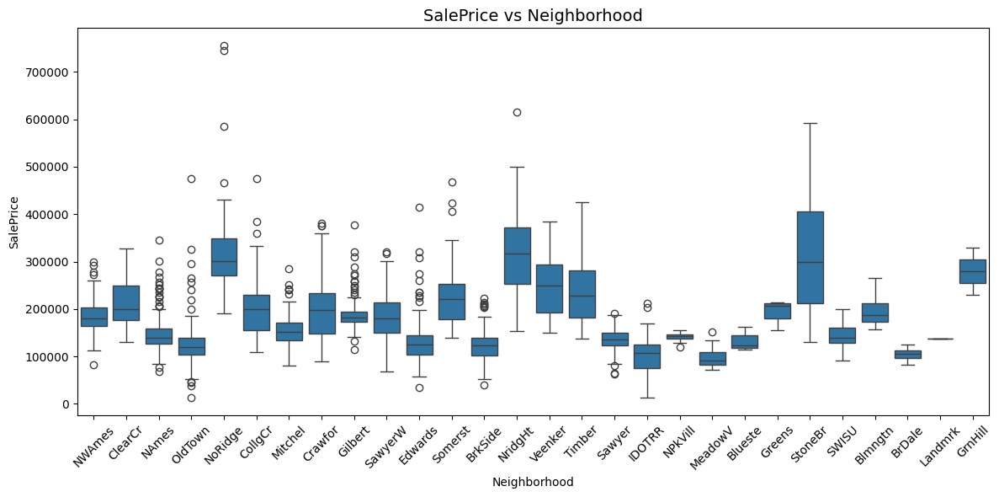

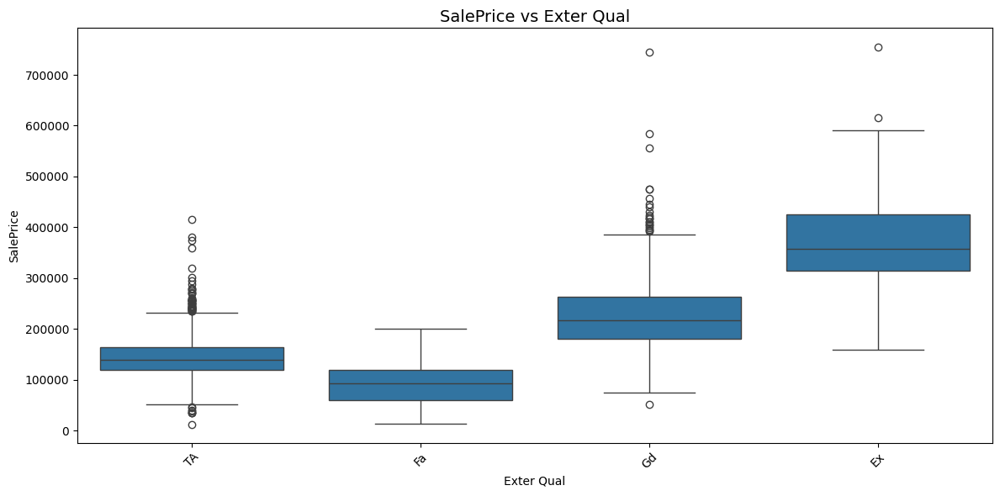

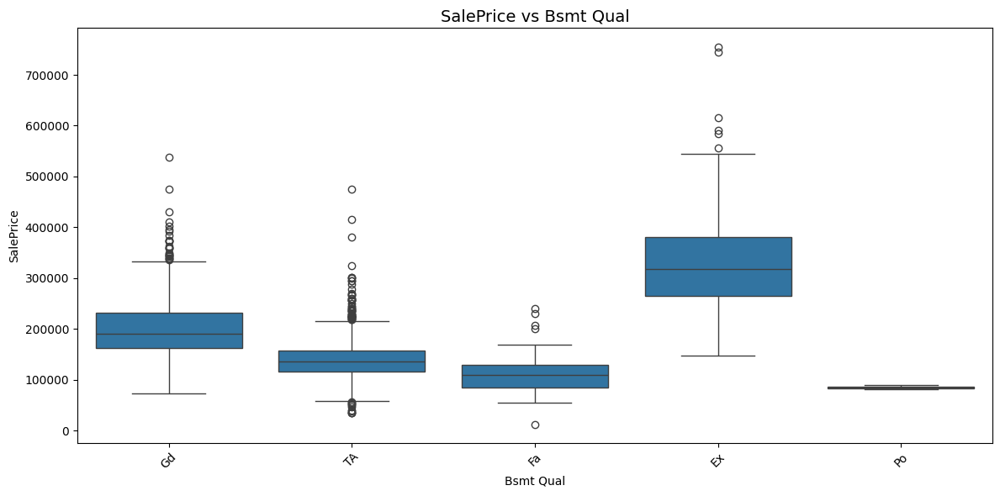

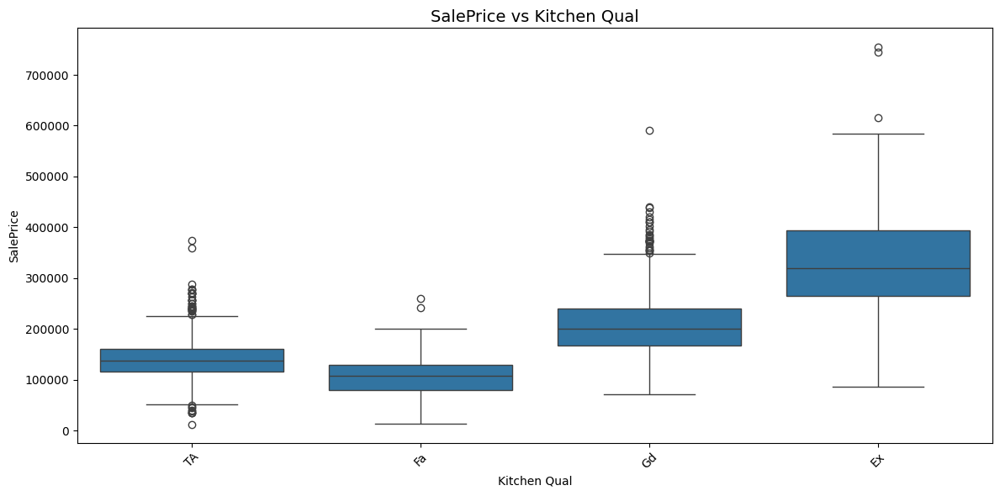

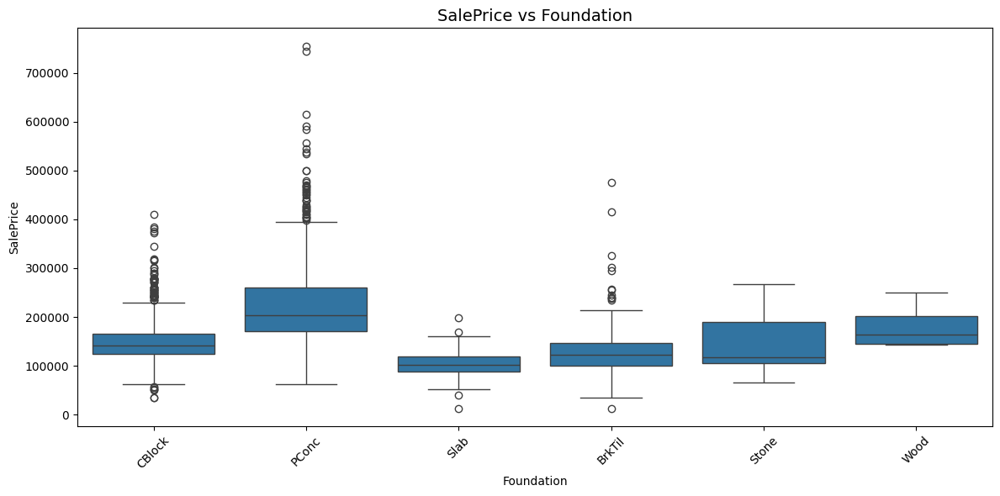

...

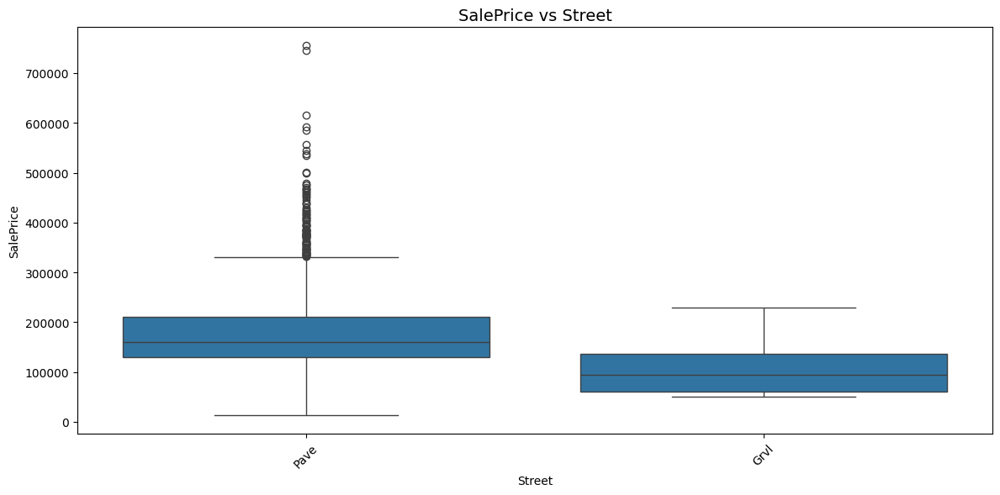

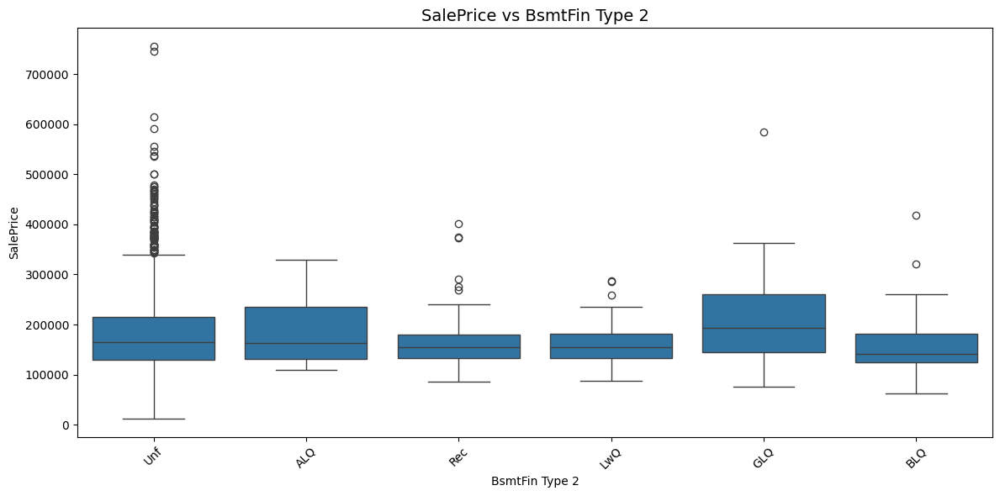

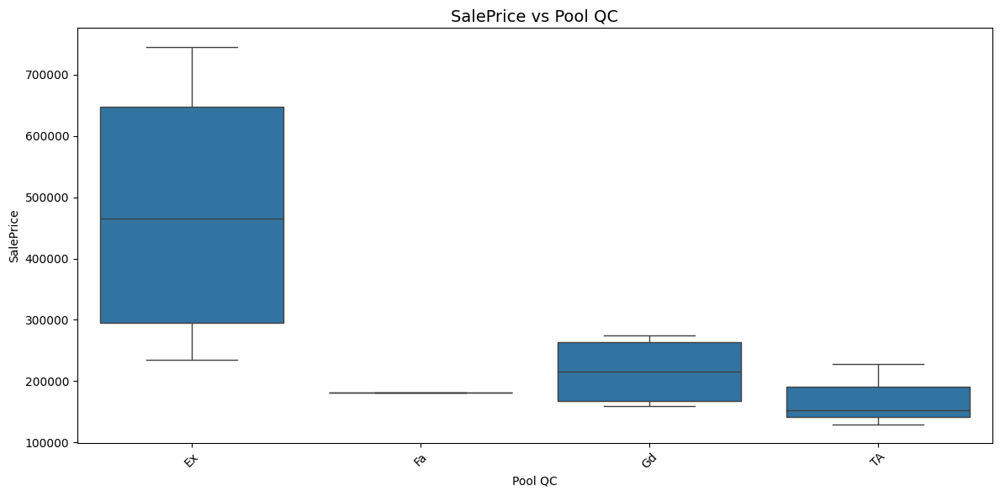

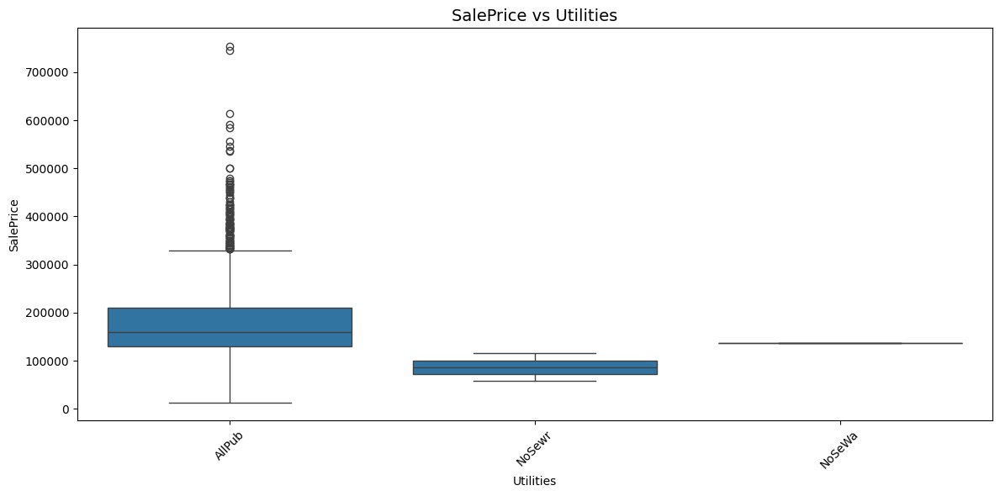

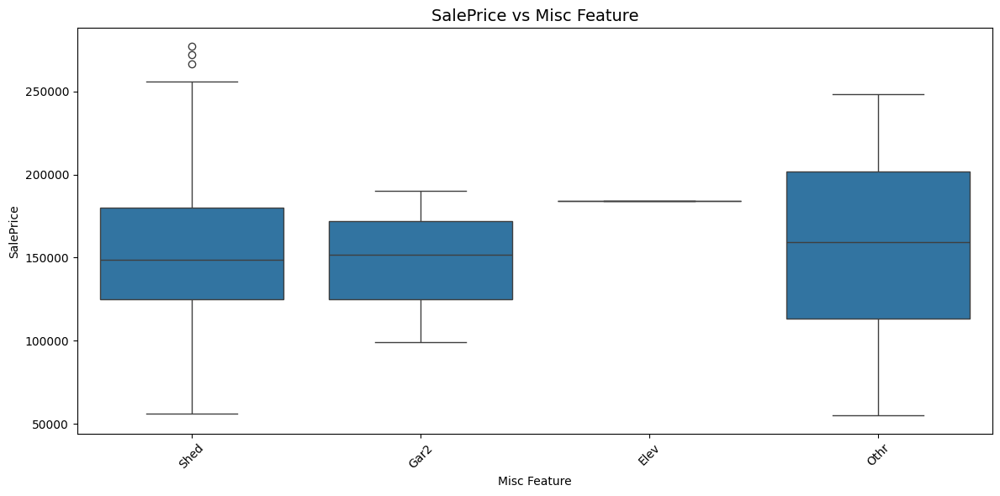

In [18]:
for feature in anova_results['Feature']:
    plt.figure(figsize=(12,6))
    sns.boxplot(x=feature, y="SalePrice", data=df_train)
    plt.title(f"SalePrice vs {feature}", fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [19]:
df_train = df_train.drop(['Misc Feature', 'Pool QC'], axis=1)

In [20]:
feature_cols = [c for c in df_train.columns if c != 'SalePrice']
X = df_train[feature_cols]
y = df_train['SalePrice']

In [21]:
X_train_split, X_test_split, y_train_split, y_test_split = train_test_split(
    X, y,
    test_size=0.2,
    random_state=SEED,
    shuffle=True,
)

Modelo Baseline

In [22]:
categorical_cols = X_train_split.select_dtypes(include=["object", "category"]).columns.tolist()
numeric_cols = X_train_split.select_dtypes(include=[np.number]).columns.tolist()

numeric_pipe = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

categorical_pipe = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("ohe", OneHotEncoder(handle_unknown="ignore"))
])

preprocess = ColumnTransformer(
    transformers=[
        ("num", numeric_pipe, numeric_cols),
        ("cat", categorical_pipe, categorical_cols),
    ],
    remainder="drop",
    n_jobs=None
)

pipe_dummy = Pipeline([
    ("preprocess", preprocess),
    ("model", DummyRegressor(strategy="median"))
])

pipe_lr = Pipeline([
    ("preprocess", preprocess),
    ("model", LinearRegression())
])

pipe_ridge = Pipeline([
    ("preprocess", preprocess),
    ("model", Ridge(alpha=1.0, random_state=SEED))
])

def cv_report(pipe, X, y, name):
    kf = KFold(n_splits=KF_SPLITS, shuffle=True, random_state=SEED)
    mae = -cross_val_score(pipe, X, y, cv=kf, scoring="neg_mean_absolute_error", n_jobs=-1)
    mse = -cross_val_score(pipe, X, y, cv=kf, scoring="neg_mean_squared_error", n_jobs=-1)
    rmse = np.sqrt(mse)
    print(f"\n{name} — 5-Fold CV")
    print(f"MAE  : {mae.mean():.0f}")
    print(f"RMSE : {rmse.mean():.0f}")

for name, pipe in [
    ("Dummy (Mediana)", pipe_dummy),
    ("LinearRegression", pipe_lr),
    ("Ridge (α=1.0)", pipe_ridge),
]:
    cv_report(pipe, X_train_split, y_train_split, name)




Dummy (Mediana) — 5-Fold CV
MAE  : 54593
RMSE : 80020

LinearRegression — 5-Fold CV
MAE  : 17822
RMSE : 32692

Ridge (α=1.0) — 5-Fold CV
MAE  : 17646
RMSE : 31287


Pré - Processamento

In [23]:
def engineer_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()

    df["House_Age"] = df["Yr Sold"] - df["Year Built"]
    df["Years_Since_Remodel"] = df["Yr Sold"] - df["Year Remod/Add"]
    df["Is_Remodeled"] = (df["Year Built"] != df["Year Remod/Add"]).astype(int)
    gyb = df["Garage Yr Blt"].fillna(df["Year Built"])
    df["Garage_Age"] = df["Yr Sold"] - gyb

    df["Total_Bathrooms"] = df["Full Bath"] + 0.5*df["Half Bath"] + df["Bsmt Full Bath"] + 0.5*df["Bsmt Half Bath"]
    df["Total_SF"] = df["Gr Liv Area"] + df["Total Bsmt SF"]
    df["Total_Porch_Area"] = df["Open Porch SF"] + df["Enclosed Porch"] + df["3Ssn Porch"] + df["Screen Porch"]
    df["Total_Outdoor_Space"] = df["Wood Deck SF"] + df["Total_Porch_Area"]
    df["Bsmt_Finished_SF"] = df["BsmtFin SF 1"] + df["BsmtFin SF 2"]
    df["Bsmt_Fin_Ratio"] = df["Bsmt_Finished_SF"] / df["Total Bsmt SF"]

    df["OverallQual_GrLivArea"] = df["Overall Qual"] * df["Gr Liv Area"]

    df["Has_Garage"] = (df["Garage Area"] > 0).astype(int)
    df["Garage_Area_per_Car"] = df["Garage Area"] / df["Garage Cars"]

    df["Bedroom_Ratio"] = df["Bedroom AbvGr"] / df["TotRms AbvGrd"]
    df["Bath_Ratio"] = df["Total_Bathrooms"] / df["TotRms AbvGrd"]
    df["GarageCars_RoomRatio"] = df["Garage Cars"] / df["TotRms AbvGrd"]

    df["Overall_Score"] = df["Overall Qual"] * df["Overall Cond"]

    drop_cols = [
        "Yr Sold","Year Built","Year Remod/Add","Garage Yr Blt",
        "Full Bath","Half Bath","Bsmt Full Bath","Bsmt Half Bath",
        "Open Porch SF","Enclosed Porch","3Ssn Porch","Screen Porch","Wood Deck SF",
        "BsmtFin SF 1","BsmtFin SF 2",
        "Bedroom AbvGr","TotRms AbvGrd","Garage Cars",
        "Lot Area","Gr Liv Area","Total Bsmt SF","1st Flr SF","Garage Area",
        "Mo Sold",
    ]
    df.drop(columns=[c for c in drop_cols if c in df.columns], errors="ignore", inplace=True)

    return df

In [24]:
def alley_presence(df_col: pd.DataFrame) -> pd.DataFrame:
    col = df_col.iloc[:, 0]
    return pd.DataFrame({"Alley": col.notna().astype(int)}, index=df_col.index)

alley_step = ColumnTransformer(
    transformers=[
        ("alley_presence",
         FunctionTransformer(alley_presence, feature_names_out="one-to-one"),
         ["Alley"]),
    ],
    remainder="passthrough",
    verbose_feature_names_out=False,
)

defaults = ColumnTransformer(
    transformers=[
        ("num_default",
         SimpleImputer(strategy="median"),
         make_column_selector(dtype_include=np.number)),
        ("cat_default",
         SimpleImputer(strategy="most_frequent"),
         make_column_selector(dtype_exclude=np.number)),
    ],
    remainder="passthrough",
    verbose_feature_names_out=False,
)


NUMERIC_BUT_CATEGORICAL = ["MS SubClass"]

def cast_to_str(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    for c in NUMERIC_BUT_CATEGORICAL:
        if c in df.columns:
            df[c] = df[c].astype("string")
    return df

preprocess = Pipeline(steps=[
    ("alley_presence", alley_step),
    ("defaults", defaults),
    ("cast_numeric_cats", FunctionTransformer(cast_to_str))
    ])
preprocess.set_output(transform="pandas")


def split_cat_by_cardinality(df: pd.DataFrame, max_ohe_unique: int = 5):
    cat_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()
    card = df[cat_cols].nunique(dropna=True)
    ohe_cols = card[card <= max_ohe_unique].index.tolist()
    te_cols  = card[card >  max_ohe_unique].index.tolist()
    return ohe_cols, te_cols

def make_encoders(ohe_cols, te_cols):
    return ColumnTransformer(
        transformers=[
            ("ohe", OneHotEncoder(handle_unknown="ignore", sparse_output=False), ohe_cols),
            ("te", TargetEncoder(handle_unknown="value", handle_missing="value", smoothing=10.0), te_cols),
            ("num_pass", "passthrough", make_column_selector(dtype_include=np.number)),
        ],
        remainder="drop",
        verbose_feature_names_out=False,
    )

X_train_pre = preprocess.fit_transform(X_train_split)   
ohe_cols, te_cols = split_cat_by_cardinality(X_train_pre, max_ohe_unique=5)
encoders = make_encoders(ohe_cols, te_cols)

ohe_cols, te_cols = split_cat_by_cardinality(X_train_pre, max_ohe_unique=5)
print("OHE cols:", ohe_cols)
print("TE cols :", te_cols)

encoders = make_encoders(ohe_cols, te_cols)

final_num_imputer = ColumnTransformer(
    transformers=[
        ("num_final", SimpleImputer(strategy="median"), make_column_selector(dtype_include=np.number)),
    ],
    remainder="passthrough",
    verbose_feature_names_out=False,
)

full_pipeline = Pipeline([
    ("preprocess", preprocess),
    ("encode", encoders),
    ("feat_eng", FunctionTransformer(engineer_features, validate=False)),
    ("final_impute", final_num_imputer),

])
full_pipeline.set_output(transform="pandas")

full_pipeline.fit(X_train_split, y_train_split)

X_train_ready = full_pipeline.transform(X_train_split)
X_test_ready = full_pipeline.transform(X_test_split)
assert not X_train_ready.isnull().any().any()
print("Final shape:", X_train_ready.shape)
print("Example columns:", X_train_ready.columns[:12].tolist())

print("Final shape:", X_test_ready.shape)
print("Example columns:", X_test_ready.columns[:12].tolist())

OHE cols: ['Street', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config', 'Land Slope', 'Bldg Type', 'Mas Vnr Type', 'Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'Heating', 'Heating QC', 'Central Air', 'Electrical', 'Kitchen Qual', 'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Fence']
TE cols : ['MS SubClass', 'MS Zoning', 'Neighborhood', 'Condition 1', 'Condition 2', 'House Style', 'Roof Style', 'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Foundation', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Functional', 'Garage Type', 'Sale Type', 'Sale Condition']
Final shape: (1875, 145)
Example columns: ['Street_Grvl', 'Street_Pave', 'Lot Shape_IR1', 'Lot Shape_IR2', 'Lot Shape_IR3', 'Lot Shape_Reg', 'Land Contour_Bnk', 'Land Contour_HLS', 'Land Contour_Low', 'Land Contour_Lvl', 'Utilities_AllPub', 'Utilities_NoSeWa']
Final shape: (469, 145)
Example columns: ['Street_Grvl', 'Street_Pave', 'Lot Shape_IR1', 'Lot Shape_IR2', 'Lot Shape_IR3',

In [25]:
xgb_model = XGBRegressor(
    n_estimators=1000, max_depth=6, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0,
    tree_method="hist", n_jobs=-1, random_state=SEED, eval_metric="rmse",
)

pipe_xgb = Pipeline([
    ("preprocess", preprocess),
    ("encode", encoders),
    ("feat_eng", FunctionTransformer(engineer_features, validate=False)),
    ("final_impute", final_num_imputer),
    ("model", xgb_model),
])
pipe_xgb.set_output(transform="pandas")

cv = KFold(n_splits=KF_SPLITS, shuffle=True, random_state=SEED)

scores = cross_validate(
    pipe_xgb, X_train_split, y_train_split,
    scoring={"MAE": "neg_mean_absolute_error",
             "RMSE": "neg_root_mean_squared_error",
             "R2": "r2"},
    cv=KF_SPLITS, n_jobs=-1, return_train_score=False, error_score="raise"
)
print("MAE:", -scores["test_MAE"].mean())
print("RMSE:", -scores["test_RMSE"].mean())
print("R2:", scores["test_R2"].mean())


MAE: 14949.30703125
RMSE: 25942.510546875
R2: 0.8832749247550964


In [27]:
xgb =  XGBRegressor(
    n_estimators=1000, max_depth=6, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0,
    tree_method="hist", n_jobs=-1, random_state=SEED, eval_metric="rmse",
)

pipe_xgb = Pipeline(steps=[
    ("preprocess", preprocess),
    ("encode", encoders),
    ("feat_eng", FunctionTransformer(engineer_features, validate=False)),
    ("final_impute", final_num_imputer),
    ("model", xgb),
], verbose=False)


search_space = {
    "model__n_estimators": Integer(300, 2000),
    "model__max_depth": Integer(3, 12),
    "model__learning_rate": Real(1e-3, 0.3, prior="log-uniform"),
    "model__subsample": Real(0.5, 1.0),
    "model__colsample_bytree": Real(0.5, 1.0),
    "model__min_child_weight": Integer(1, 20),
    "model__gamma": Real(0.0, 5.0),
    "model__reg_alpha": Real(1e-8, 10.0, prior="log-uniform"),
    "model__reg_lambda": Real(1e-8, 10.0, prior="log-uniform"),
    "model__grow_policy": Categorical(["depthwise", "lossguide"]),
}

cv = KFold(n_splits=5, shuffle=True, random_state=42)

bayes = BayesSearchCV(
    estimator=pipe_xgb,
    search_spaces=search_space,
    n_iter=60,                             
    cv=KF_SPLITS,
    scoring="neg_mean_absolute_error", 
    n_jobs=-1,
    refit=True,                           
    random_state=SEED,
    return_train_score=False,
    verbose=0
)

callbacks = [
    DeltaYStopper(delta=1e-4, n_best=15),
]

bayes.fit(X_train_split, y_train_split, callback=callbacks)

print("Best hyperparameters:")
for k, v in bayes.best_params_.items():
    print(f"  {k}: {v}")

best_mae = -bayes.best_score_
print(f"\nCV MAE (best): {best_mae:,.4f}")

final_model = bayes.best_estimator_

Best hyperparameters:
  model__colsample_bytree: 0.5
  model__gamma: 5.0
  model__grow_policy: depthwise
  model__learning_rate: 0.02538340431990869
  model__max_depth: 4
  model__min_child_weight: 1
  model__n_estimators: 1389
  model__reg_alpha: 0.0636264869331927
  model__reg_lambda: 1e-08
  model__subsample: 0.5

CV MAE (best): 14,252.8727


In [28]:
def eval_on_holdout(name, estimator, X_test, y_test):
    y_pred = estimator.predict(X_test)
    mae  = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2   = r2_score(y_test, y_pred)
    print(f"\nHoldout — {name}")
    print(f"MAE : {mae:,.2f}")
    print(f"RMSE: {rmse:,.2f}")
    print(f"R²  : {r2:.4f}")
    return {"name": name, "MAE": mae, "RMSE": rmse, "R2": r2, "pred": y_pred}

pipe_ridge.fit(X_train_split, y_train_split)
ridge_res = eval_on_holdout("Ridge (baseline)", pipe_ridge, X_test_split, y_test_split)

final_model.fit(X_train_split, y_train_split)
xgb_res = eval_on_holdout("XGB (best_estimator_)", final_model, X_test_split, y_test_split)

print("\n===   Comparison   ===")
for res in (ridge_res, xgb_res):
    print(f"{res['name']:<24}  MAE: {res['MAE']:>10,.2f} | RMSE: {res['RMSE']:>10,.2f} | R²: {res['R2']:.4f}")



Holdout — Ridge (baseline)
MAE : 16,072.29
RMSE: 25,960.65
R²  : 0.8761

Holdout — XGB (best_estimator_)
MAE : 12,339.09
RMSE: 17,332.38
R²  : 0.9448

===   Comparison   ===
Ridge (baseline)          MAE:  16,072.29 | RMSE:  25,960.65 | R²: 0.8761
XGB (best_estimator_)     MAE:  12,339.09 | RMSE:  17,332.38 | R²: 0.9448


In [31]:
import os, mlflow
os.environ["MLFLOW_TRACKING_USERNAME"] = "admin"
os.environ["MLFLOW_TRACKING_PASSWORD"] = "password1234"

mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment("house-price-predictors")

def skim_params(estimator, allow=()):
    p = estimator.get_params(deep=False)
    keep = {"alpha","random_state","fit_intercept","normalize","copy_X","positive"}
    return {k: v for k, v in p.items() if (k in keep) or (k in allow)}

def log_one_model(name, pipeline, Xtr, ytr, Xte, yte, seed):
    kf = KFold(n_splits=KF_SPLITS, shuffle=True, random_state=seed)
    neg_mae = cross_val_score(pipeline, Xtr, ytr, cv=kf, scoring="neg_mean_absolute_error", n_jobs=-1)
    neg_mse = cross_val_score(pipeline, Xtr, ytr, cv=kf, scoring="neg_mean_squared_error", n_jobs=-1)
    mae_vals = -neg_mae
    rmse_vals = np.sqrt(-neg_mse)

    with mlflow.start_run(run_name=name):
        est = pipeline.named_steps["model"]
        mlflow.set_tags({
            "model_name": name,
            "stage": "baseline",
            "problem_type": "regression",
            "pipeline": "preprocess->model",
        })
        mlflow.log_params({
            "SEED": seed,
            "cv_n_splits": kf.get_n_splits(),
            "estimator": est.__class__.__name__,
            **skim_params(est),
        })

        mlflow.log_metrics({
            "cv_MAE_mean": float(mae_vals.mean()),
            "cv_MAE_std":  float(mae_vals.std()),
            "cv_RMSE_mean": float(rmse_vals.mean()),
            "cv_RMSE_std":  float(rmse_vals.std()),
        })

        pipeline.fit(Xtr, ytr)
        y_pred = pipeline.predict(Xte)
        holdout_mae = mean_absolute_error(yte, y_pred)
        holdout_rmse = np.sqrt(mean_squared_error(yte, y_pred))
        holdout_r2 = r2_score(yte, y_pred)

        mlflow.log_metrics({
            "holdout_MAE": float(holdout_mae),
            "holdout_RMSE": float(holdout_rmse),
            "holdout_R2": float(holdout_r2),
            "n_train": int(len(Xtr)),
            "n_test": int(len(Xte)),
        })

        input_example = Xtr.head(5)
        signature = infer_signature(input_example, pipeline.predict(input_example))
        mlflow.sklearn.log_model(
            sk_model=pipeline,
            name="model",
            signature=signature,
            input_example=input_example,
        )

candidates = [
    ("Dummy (Mediana)", pipe_dummy),
    ("LinearRegression", pipe_lr),
    ("Ridge (α=1.0)", pipe_ridge),
    ("XGB_tunned_feat_eng", pipe_xgb)
]

for name, pipe in candidates:
    print(f"Logging {name} to MLflow…")
    log_one_model(name, pipe, X_train_split, y_train_split, X_test_split, y_test_split, SEED)

for name, pipe in candidates:
    cv_report(pipe, X_train_split, y_train_split, name)

Logging Dummy (Mediana) to MLflow…


/home/lopes/miniconda3/envs/cloud2go/lib/python3.10/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run Dummy (Mediana) at: http://localhost:5000/#/experiments/1/runs/167bd9965e1d4f40b0431922b594329d
🧪 View experiment at: http://localhost:5000/#/experiments/1
Logging LinearRegression to MLflow…


/home/lopes/miniconda3/envs/cloud2go/lib/python3.10/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run LinearRegression at: http://localhost:5000/#/experiments/1/runs/866572ee6e294733b3cf1edfd366ddef
🧪 View experiment at: http://localhost:5000/#/experiments/1
Logging Ridge (α=1.0) to MLflow…


/home/lopes/miniconda3/envs/cloud2go/lib/python3.10/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run Ridge (α=1.0) at: http://localhost:5000/#/experiments/1/runs/66559fc015904856931614af4d246de7
🧪 View experiment at: http://localhost:5000/#/experiments/1
Logging XGB_tunned_feat_eng to MLflow…


/home/lopes/miniconda3/envs/cloud2go/lib/python3.10/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run XGB_tunned_feat_eng at: http://localhost:5000/#/experiments/1/runs/b37dcc7e8ec54b558bfa0c54cbb9a370
🧪 View experiment at: http://localhost:5000/#/experiments/1

Dummy (Mediana) — 5-Fold CV
MAE  : 54593
RMSE : 80020

LinearRegression — 5-Fold CV
MAE  : 17822
RMSE : 32692

Ridge (α=1.0) — 5-Fold CV
MAE  : 17646
RMSE : 31287

XGB_tunned_feat_eng — 5-Fold CV
MAE  : 14705
RMSE : 24769


In [32]:
import mlflow
exp = mlflow.get_experiment_by_name("house-price-predictors")
print("Experiment artifact_location:", exp.artifact_location)
# Inside a run, also check:
with mlflow.start_run():
    print("Run artifact URI:", mlflow.get_artifact_uri())


Experiment artifact_location: mlflow-artifacts:/1
Run artifact URI: mlflow-artifacts:/1/b955a7b52185478382d2f34397e13b81/artifacts
🏃 View run invincible-panda-425 at: http://localhost:5000/#/experiments/1/runs/b955a7b52185478382d2f34397e13b81
🧪 View experiment at: http://localhost:5000/#/experiments/1
